<div style="background-color:pink; padding:20px; text-align:center; font-weight: bold;">
    <h2>Image Processing Techniques 🪄</h2>
    <ul>
        <li>Edge Detection</li>
        <li>Rotation</li>
        <li>Adjust image</li>
        <li>Compress image</li>
    </ul>
</div>






### First we import some important libraries :

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image , ImageEnhance
import cv2
import os


### Create a Data Frame with the images we will use :

In [2]:

image_filenames = ['ge4.jpg', 'ge3.jpg', 'ge2.jpg', 'ge1.jpg', 'lena.jpg','fl1.jpg','fl2.jpg','fl3.jpg','fl4.jpg','fl5.jpg']

df = pd.DataFrame({'image': image_filenames})

df.to_csv('image_filenames.csv')

df


,image
0,ge4.jpg
1,ge3.jpg
2,ge2.jpg
3,ge1.jpg
4,lena.jpg
5,fl1.jpg
6,fl2.jpg
7,fl3.jpg
8,fl4.jpg
9,fl5.jpg


<div style="background-color:pink; padding:20px; text-align:center; font-weight: bold;">
    <h2>Edge Detection</h2>
</div>


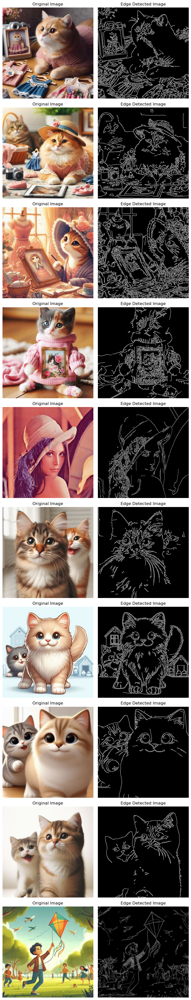

In [7]:


# Function to apply edge detection using Sobel, Prewitt, or Canny edge detectors
def apply_edge_detection(image_path, method='canny', threshold1=100, threshold2=200):
    # Read the image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    
        # Apply Canny edge detection
    edges = cv2.Canny(img, threshold1, threshold2)
    
    return edges


processed_images = []
for idx, row in df.iterrows():
    edge_img = apply_edge_detection(row['image'], method='canny', threshold1=100, threshold2=200)
    processed_images.append(edge_img)


fig, axes = plt.subplots(len(processed_images), 2, figsize=(8, len(processed_images)*4))
for i, (original_img, edge_img) in enumerate(zip(df['image'], processed_images)):
    original = cv2.imread(original_img)
    axes[i, 0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(edge_img, cmap='gray')
    axes[i, 1].set_title("Edge Detected Image")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


<div style="background-color:pink; padding:20px; text-align:center; font-weight: bold;">
    <h2>Rotation</h2>
</div>


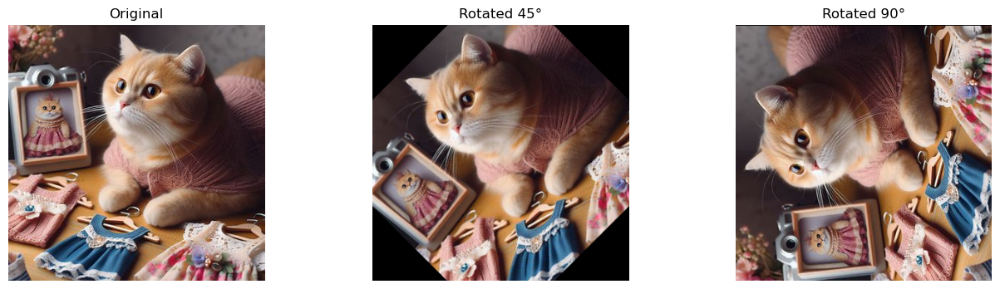

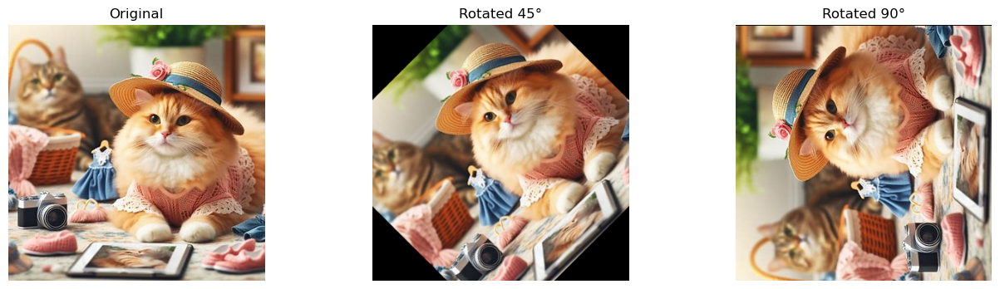

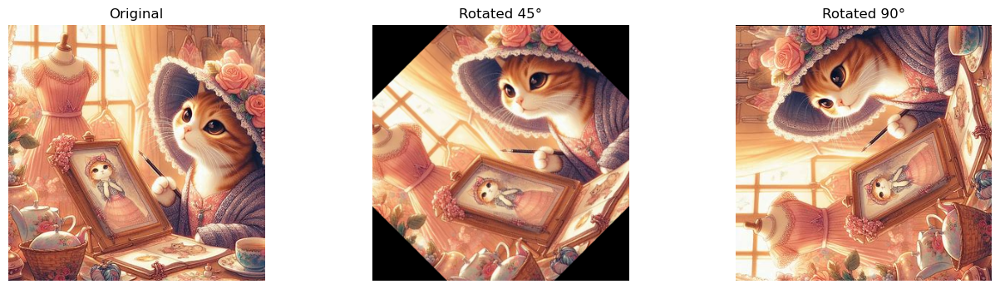

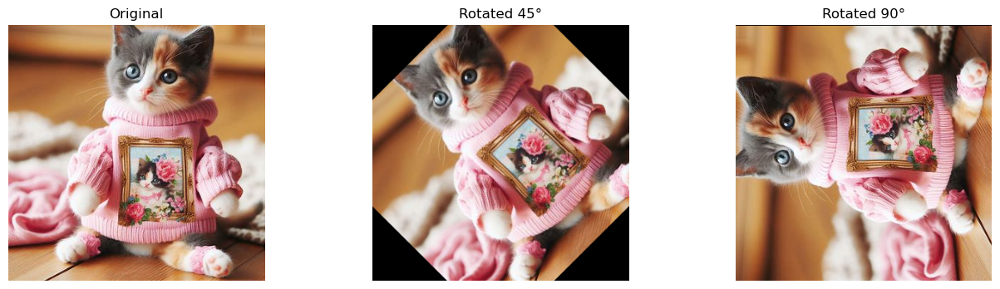

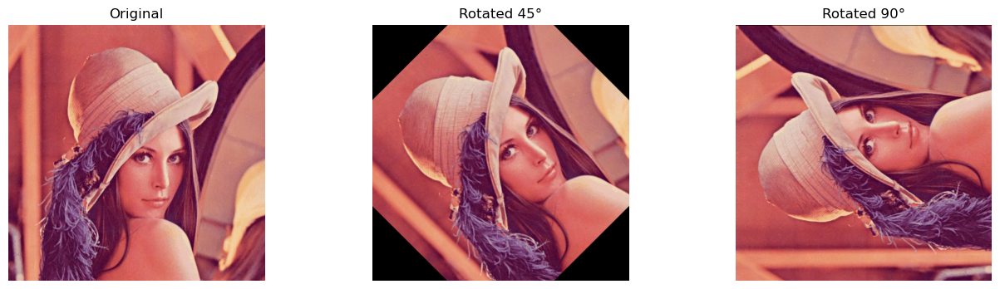

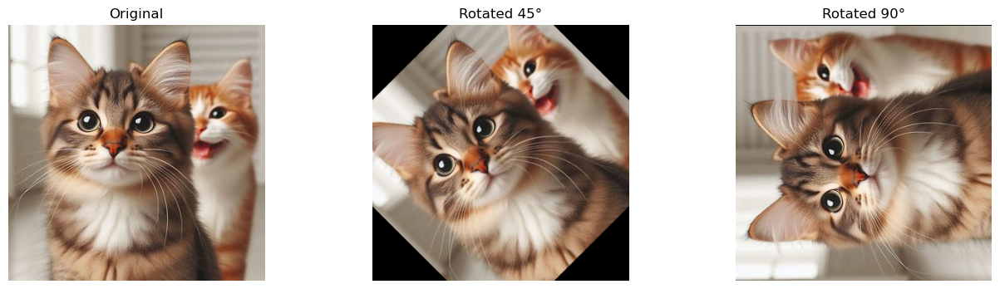

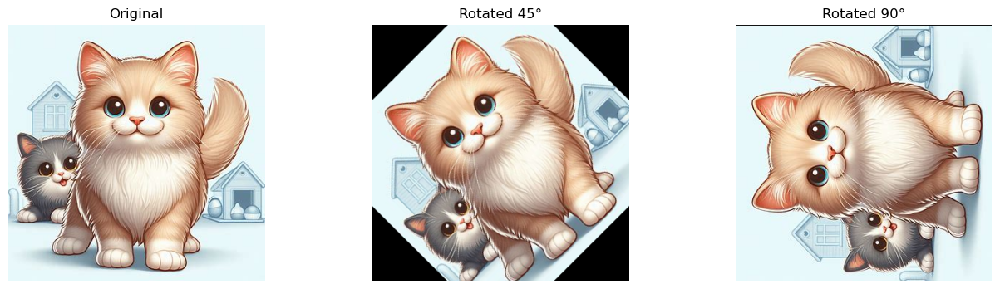

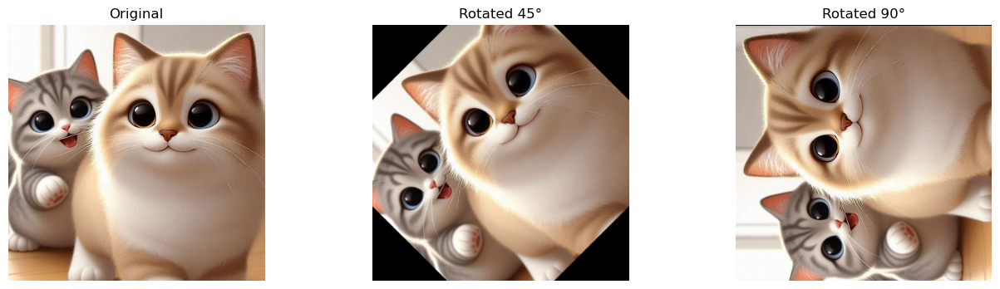

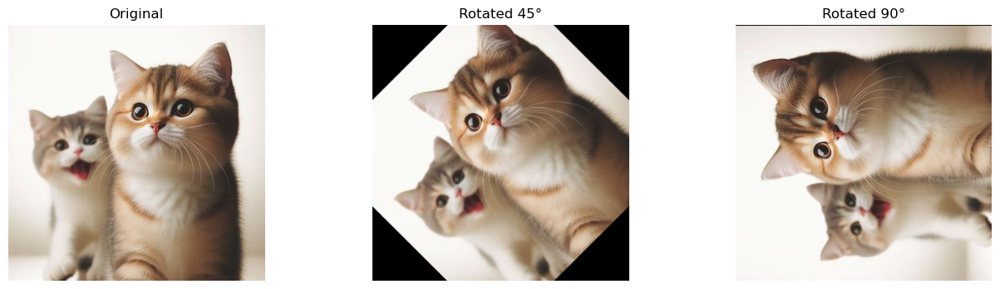

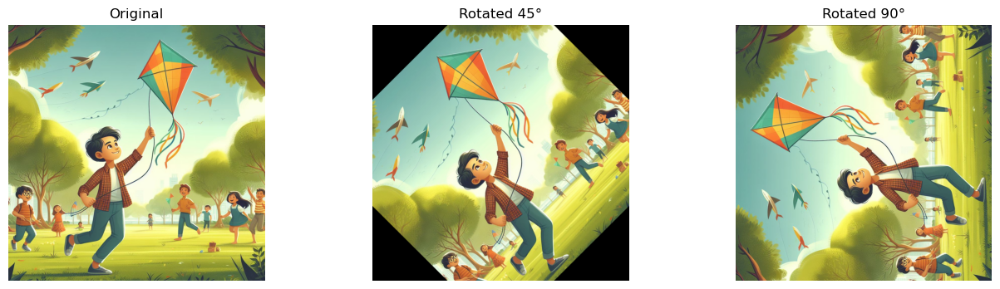

In [14]:
# Function to apply image Rotation
def apply_processing(image_filename, rotation_angle):
    # Read the image
    image = cv2.imread(image_filename)
    if image is None:
        return None
    
    # Rotate the image
    rows, cols, _ = image.shape
    rotation_matrix = cv2.getRotationMatrix2D((cols/2, rows/2), rotation_angle, 1)
    rotated = cv2.warpAffine(image, rotation_matrix, (cols, rows))
    
    
    return rotated


rotation_angles = [45 ,90]

# Apply image processing techniques to each image and store the results in new columns
for angle in rotation_angles:
    df[f'rotated_{angle}'] = df['image'].apply(lambda x: apply_processing(x, angle))

# Display original and rotated images
for idx, row in df.iterrows():
    original_image = cv2.imread(row['image'])
    
    plt.figure(figsize=(16, 4))
    plt.subplot(1, len(rotation_angles) + 1, 1)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')
    
    for i, angle in enumerate(rotation_angles):
        rotated_image = row[f'rotated_{angle}']
        plt.subplot(1, len(rotation_angles) + 1, i + 2)
        plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
        plt.title(f'Rotated {angle}°')
        plt.axis('off')
    
    plt.show()

<div style="background-color:pink; padding:20px; text-align:center; font-weight: bold;">
    <h2>Adjust image</h2>
</div>


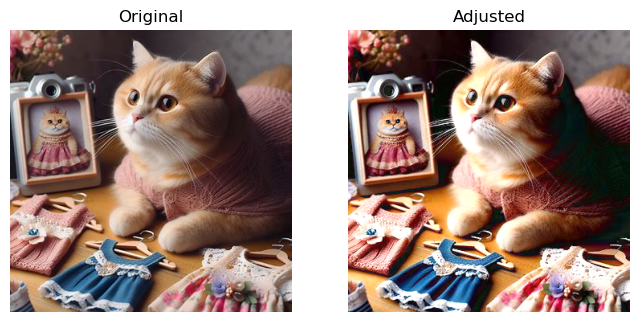

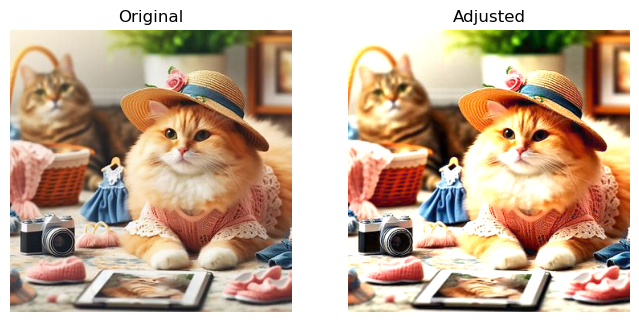

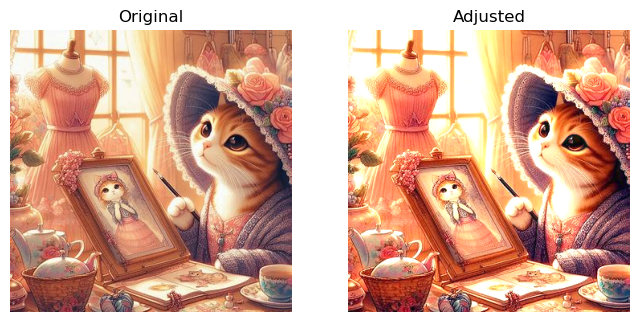

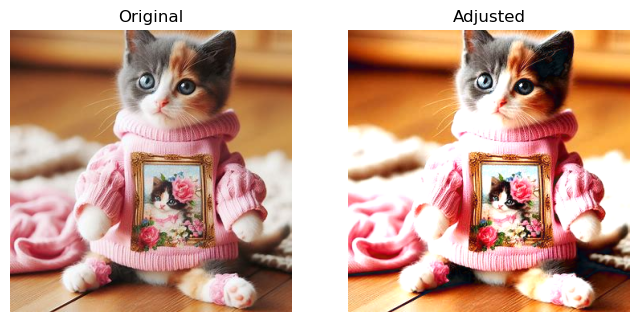

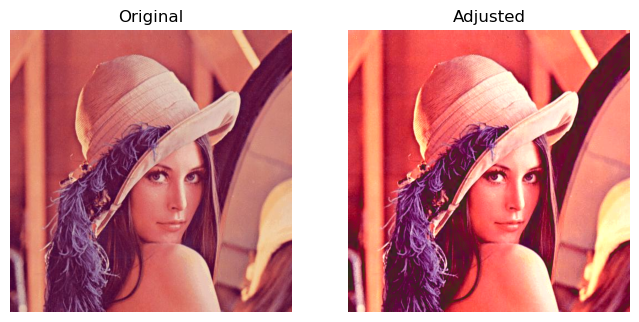

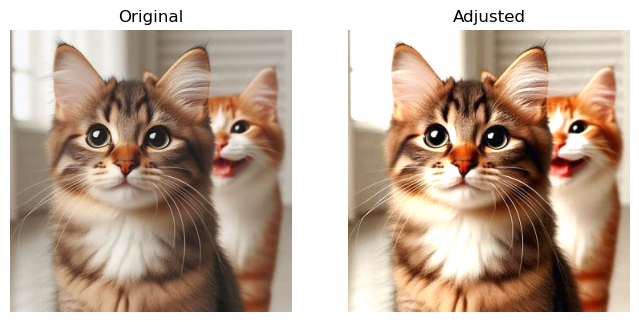

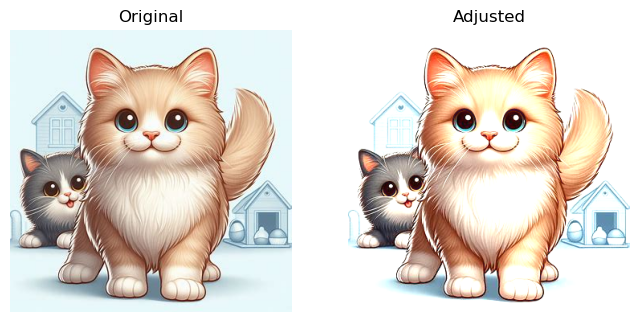

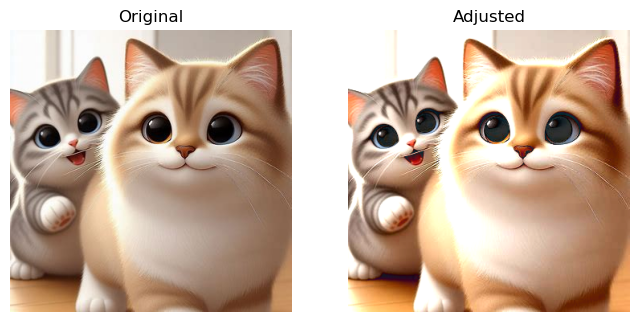

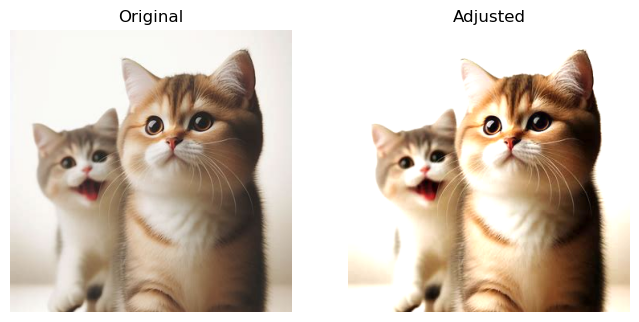

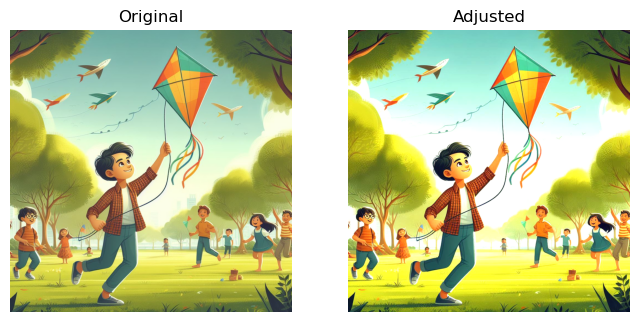

In [42]:
# Function to apply image processing techniques
def apply_processing(image_filename, brightness_factor, contrast_factor):
   
    image = cv2.imread(image_filename)
    if image is None:
        return None
    
    # Apply brightness and contrast adjustment
    adjusted = cv2.convertScaleAbs(image, alpha=contrast_factor, beta=brightness_factor)
    
    
    return adjusted

brightness_factor = -50  # Adjust as needed (-100 to 100)
contrast_factor = 1.5  # Adjust as needed (>0)

df['adjusted'] = df['image'].apply(lambda x: apply_processing(x, brightness_factor, contrast_factor))

for idx, row in df.iterrows():
    original_image = cv2.imread(row['image'])
    adjusted_image = row['adjusted']
    
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(adjusted_image, cv2.COLOR_BGR2RGB))
    plt.title('Adjusted')
    plt.axis('off')
    
    plt.show()

<div style="background-color:pink; padding:20px; text-align:center; font-weight: bold;">
    <h2>Compress image</h2>
</div>


In [30]:
# Function to compress images
def compress_image(input_image_path, output_image_path, quality=70):
    # Open and convert the image to RGB mode
    image = Image.open(input_image_path)
    rgb_image = image.convert('RGB')
    
    # Define the new size for resizing
    width, height = rgb_image.size
    new_size = (width // 2, height // 2)
    
    # Resize the image
    resized_image = rgb_image.resize(new_size)
    
    # Save the resized image as a JPG with compression
    resized_image.save(output_image_path, optimize=True, quality=quality)
    
    # Get file sizes
    original_size = os.path.getsize(input_image_path)
    compressed_size = os.path.getsize(output_image_path)
    
    return original_size, compressed_size

# Define parameters
quality = 50  # Adjust as needed

# Apply compression to each image in the DataFrame
df['original_size'], df['compressed_size'] = zip(*df['image'].apply(lambda x: compress_image(x, 'output_' + os.path.basename(x), quality)))

# Display original and compressed image sizes
print(df[['image', 'original_size', 'compressed_size']])

      image  original_size  compressed_size
0   ge4.jpg          29151             5622
1   ge3.jpg          26694             5787
2   ge2.jpg          37764             5871
3   ge1.jpg          25135             5055
4  lena.jpg          39744             8010
5   fl1.jpg          19881             4251
6   fl2.jpg          25571             4759
7   fl3.jpg          17032             3905
8   fl4.jpg          13575             3230
9   fl5.jpg         167955            28039
